In [1]:
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.nn.functional as F
import torch
from tqdm import tqdm
import scanpy as sc
from transformers import AutoTokenizer, AutoModel
import anndata as ad
import numpy as np
import pandas as pd
from goatools import obo_parser
from collections import defaultdict
import ast
import re


/home/users/thiemea/micromamba/envs/cn_env/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Load Models

In [2]:
class DualEncoder(nn.Module):
    def __init__(self, go_dim=768, esm_dim=1280, hidden_dim=512):
        super().__init__()
        self.go_proj = nn.Sequential(
            nn.Linear(go_dim, hidden_dim),
            nn.ReLU(),
            nn.LayerNorm(hidden_dim),
        )
        self.esm_proj = nn.Sequential(
            nn.Linear(esm_dim, hidden_dim),
            nn.ReLU(),
            nn.LayerNorm(hidden_dim),
        )

    def forward(self, go_embed, esm_embed):
        go_latent = self.go_proj(go_embed)
        esm_latent = self.esm_proj(esm_embed)
        return go_latent, esm_latent

In [3]:
model = DualEncoder()
model.load_state_dict(torch.load('../models/20250516_10epoch.pt'))
model

DualEncoder(
  (go_proj): Sequential(
    (0): Linear(in_features=768, out_features=512, bias=True)
    (1): ReLU()
    (2): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
  )
  (esm_proj): Sequential(
    (0): Linear(in_features=1280, out_features=512, bias=True)
    (1): ReLU()
    (2): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
  )
)

In [4]:
MODEL_NAME = "microsoft/BiomedNLP-PubMedBERT-base-uncased-abstract-fulltext"
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)
go_model = AutoModel.from_pretrained(MODEL_NAME)

def embed_text(text):
    inputs = tokenizer(text, return_tensors="pt", truncation=True, padding=True)
    with torch.no_grad():
        outputs = go_model(**inputs)
    # Use [CLS] token representation
    cls_embedding = outputs.last_hidden_state[:, 0, :]
    return cls_embedding.squeeze().cpu().numpy()

## Load Data

In [5]:
data = torch.load('../data/data.pt')
train_data = torch.load('../data/train_data.pt')
val_data = torch.load('../data/val_data.pt')
test_data = torch.load('../data/test_data.pt')

In [6]:
# Load gene2go
gene2go = pd.read_csv("../../decode-agent/data/gene2go_human.tsv", sep="\t")
gene2go = gene2go[["GeneID", "GO_ID"]]

geneid_to_uniprot = torch.load('../data/geneid_to_uniprot.pt')

gene2go['GeneID'] = gene2go['GeneID'].astype(str)
gene2go['uniprot_id'] = gene2go['GeneID'].map(geneid_to_uniprot)
gene2go.dropna(axis=0, inplace=True)
gene2go.drop_duplicates(inplace=True)
gene2go

,GeneID,GO_ID,uniprot_id
0,1,GO:0002764,P04217
1,1,GO:0005576,P04217
5,1,GO:0005615,P04217
6,1,GO:0005886,P04217
7,1,GO:0031093,P04217
...,...,...,...
489840,128854680,GO:0005737,Q6B8I1
489842,128854680,GO:0008138,Q6B8I1
489843,128854680,GO:0016311,Q6B8I1
489844,128854680,GO:0016787,Q6B8I1


In [7]:
go_obo = obo_parser.GODag('../data/go-basic.obo', optional_attrs=['def'])

# Convert to a DataFrame
go_terms = []
for go_id, go_term in go_obo.items():
    term_data = {
        'go_id': go_id,
        'name': go_term.name,
        'namespace': go_term.namespace,
        'definition': go_term.defn,
        'is_obsolete': go_term.is_obsolete,
        'parents': [parent.id for parent in go_term.parents],
        'children': [child.id for child in go_term.children],
    }
    go_terms.append(term_data)

go_df = pd.DataFrame(go_terms)
go_df

../data/go-basic.obo: fmt(1.2) rel(2025-03-16) 43,544 Terms; optional_attrs(def)


,go_id,name,namespace,definition,is_obsolete,parents,children
0,GO:0000001,mitochondrion inheritance,biological_process,"""The distribution of mitochondria, including t...",False,"[GO:0048308, GO:0048311]",[]
1,GO:0000002,mitochondrial genome maintenance,biological_process,"""The maintenance of the structure and integrit...",False,[GO:0007005],[]
2,GO:0000006,high-affinity zinc transmembrane transporter a...,molecular_function,"""Enables the transfer of zinc ions (Zn2+) from...",False,[GO:0005385],[]
3,GO:0000007,low-affinity zinc ion transmembrane transporte...,molecular_function,"""Enables the transfer of a solute or solutes f...",False,[GO:0005385],[]
4,GO:0000009,"alpha-1,6-mannosyltransferase activity",molecular_function,"""Catalysis of the transfer of a mannose residu...",False,[GO:0000030],"[GO:0033164, GO:0052917]"
...,...,...,...,...,...,...,...
43539,GO:0090645,ubiquitin ligase inhibitor activity,molecular_function,"""Binds to and stops, prevents or reduces the a...",False,[GO:0055105],[]
43540,GO:1904207,regulation of chemokine (C-X-C motif) ligand 2...,biological_process,"""Any process that modulates the frequency, rat...",False,[GO:0032642],"[GO:2000343, GO:2000342]"
43541,GO:0035926,regulation of chemokine (C-X-C motif) ligand 2...,biological_process,"""Any process that modulates the frequency, rat...",False,[GO:0032642],"[GO:2000343, GO:2000342]"
43542,GO:1904208,negative regulation of chemokine (C-X-C motif)...,biological_process,"""Any process that stops, prevents or reduces t...",False,"[GO:2000341, GO:0032682]",[]


## Evaluate Test Set Performance

In [8]:
def build_ground_truth_map(gene2go_df):
    mapping = defaultdict(set)
    for _, row in gene2go_df.iterrows():
        mapping[row['GO_ID']].add(row['uniprot_id'])
    return mapping

In [9]:
class GeneGODataset(Dataset):
    def __init__(self, data):
        self.data = data  # list of (go_embed, esm_embed, go_id, uniprot_id)

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        go_embed, esm_embed, go_id, uniprot_id = self.data[idx]
        return {
            "go_embed": go_embed,
            "esm_embed": esm_embed,
            "go_id": go_id,
            "uniprot_id": uniprot_id,
        }

In [10]:
go_df

,go_id,name,namespace,definition,is_obsolete,parents,children
0,GO:0000001,mitochondrion inheritance,biological_process,"""The distribution of mitochondria, including t...",False,"[GO:0048308, GO:0048311]",[]
1,GO:0000002,mitochondrial genome maintenance,biological_process,"""The maintenance of the structure and integrit...",False,[GO:0007005],[]
2,GO:0000006,high-affinity zinc transmembrane transporter a...,molecular_function,"""Enables the transfer of zinc ions (Zn2+) from...",False,[GO:0005385],[]
3,GO:0000007,low-affinity zinc ion transmembrane transporte...,molecular_function,"""Enables the transfer of a solute or solutes f...",False,[GO:0005385],[]
4,GO:0000009,"alpha-1,6-mannosyltransferase activity",molecular_function,"""Catalysis of the transfer of a mannose residu...",False,[GO:0000030],"[GO:0033164, GO:0052917]"
...,...,...,...,...,...,...,...
43539,GO:0090645,ubiquitin ligase inhibitor activity,molecular_function,"""Binds to and stops, prevents or reduces the a...",False,[GO:0055105],[]
43540,GO:1904207,regulation of chemokine (C-X-C motif) ligand 2...,biological_process,"""Any process that modulates the frequency, rat...",False,[GO:0032642],"[GO:2000343, GO:2000342]"
43541,GO:0035926,regulation of chemokine (C-X-C motif) ligand 2...,biological_process,"""Any process that modulates the frequency, rat...",False,[GO:0032642],"[GO:2000343, GO:2000342]"
43542,GO:1904208,negative regulation of chemokine (C-X-C motif)...,biological_process,"""Any process that stops, prevents or reduces t...",False,"[GO:2000341, GO:0032682]",[]


In [11]:
def cosine_sim(a, b):
    return F.normalize(a, dim=-1) @ F.normalize(b, dim=-1).T

def evaluate(model, val_dataloader, gene2go_df, k=10):
    model.eval()
    all_go_latents = []
    all_go_ids = []
    all_protein_latents = []
    all_protein_ids = []

    # Build lookup from gene2go
    ground_truth = build_ground_truth_map(gene2go_df)

    with torch.no_grad():
        for batch in val_dataloader:
            go = batch["go_embed"]
            esm = batch["esm_embed"]
            go_ids = batch["go_id"]
            protein_ids = batch["uniprot_id"]

            go_latent, esm_latent = model(go, esm)

            all_go_latents.append(go_latent)
            all_go_ids.extend(go_ids)
            all_protein_latents.append(esm_latent)
            all_protein_ids.extend(protein_ids)

    go_latents = torch.cat(all_go_latents)  # (N_go, D)
    protein_latents = torch.cat(all_protein_latents)  # (N_protein, D)

    sim_matrix = cosine_sim(go_latents, protein_latents)  # (N_go, N_protein)

    recalls = []
    precisions = []
    mrrs = []

    for i, go_id in enumerate(all_go_ids):
        true_proteins = ground_truth.get(go_id, set())
        print(f"go id: {go_id}\t{go_df[go_df['go_id'] == go_id]['name']}")
        if not true_proteins:
            continue

        sims = sim_matrix[i]  # similarities to all proteins
        topk_idx = torch.topk(sims, k)[1]
        retrieved_ids = [all_protein_ids[j] for j in topk_idx]

        hits = [1 if pid in true_proteins else 0 for pid in retrieved_ids]
        num_hits = sum(hits)
        print(f"found {num_hits} in {len(true_proteins)}")

        # Recall@k
        recalls.append(num_hits / len(true_proteins))

        # Precision@k
        precisions.append(num_hits / k)

        # MRR
        ranks = [j + 1 for j, h in enumerate(hits) if h]
        mrr = 1 / ranks[0] if ranks else 0
        mrrs.append(mrr)

    return {
        "Recall@k": sum(recalls) / len(recalls),
        "Precision@k": sum(precisions) / len(precisions),
        "MRR": sum(mrrs) / len(mrrs)
    }

In [12]:
def evaluate(model, val_dataloader, gene2go_df, k=10):
    model.eval()
    all_go_latents = []
    all_go_ids = []
    all_protein_latents = []
    all_protein_ids = []

    ground_truth = build_ground_truth_map(gene2go_df)
    go_df_indexed = go_df.set_index("go_id")

    # Precompute child and parent mappings
    go_to_parents = go_df_indexed["parents"].to_dict()
    go_to_children = go_df_indexed["children"].to_dict()

    # Compute sister terms: other children of shared parents
    go_to_sisters = {}
    for go_id, row in go_df_indexed.iterrows():
        sisters = set()
        for parent in row["parents"]:
            siblings = set(go_to_children.get(parent, []))
            sisters.update(siblings)
        sisters.discard(go_id)
        go_to_sisters[go_id] = sisters

    with torch.no_grad():
        for batch in val_dataloader:
            go = batch["go_embed"]
            esm = batch["esm_embed"]
            go_ids = batch["go_id"]
            protein_ids = batch["uniprot_id"]

            go_latent, esm_latent = model(go, esm)

            all_go_latents.append(go_latent)
            all_go_ids.extend(go_ids)
            all_protein_latents.append(esm_latent)
            all_protein_ids.extend(protein_ids)

    go_latents = torch.cat(all_go_latents)
    protein_latents = torch.cat(all_protein_latents)

    sim_matrix = cosine_sim(go_latents, protein_latents)

    recalls = []
    precisions = []
    mrrs = []

    # New: hit counts for parent/child/sister GO terms
    parent_hits_total = 0
    child_hits_total = 0
    sister_hits_total = 0
    total_queries = 0

    for i, go_id in enumerate(all_go_ids):
        true_proteins = ground_truth.get(go_id, set())
        if not true_proteins:
            continue

        # Related GO term proteins
        parent_terms = go_to_parents.get(go_id, [])
        child_terms = go_to_children.get(go_id, [])
        sister_terms = go_to_sisters.get(go_id, [])

        parent_proteins = set.union(*(ground_truth.get(p, set()) for p in parent_terms)) if parent_terms else set()
        child_proteins = set.union(*(ground_truth.get(c, set()) for c in child_terms)) if child_terms else set()
        sister_proteins = set.union(*(ground_truth.get(s, set()) for s in sister_terms)) if sister_terms else set()

        sims = sim_matrix[i]
        topk_idx = torch.topk(sims, k)[1]
        retrieved_ids = [all_protein_ids[j] for j in topk_idx]

        hits = [1 if pid in true_proteins else 0 for pid in retrieved_ids]
        num_hits = sum(hits)

        recalls.append(num_hits / len(true_proteins))
        precisions.append(num_hits / k)
        ranks = [j + 1 for j, h in enumerate(hits) if h]
        mrrs.append(1 / ranks[0] if ranks else 0)

        # Count related term hits
        parent_hits_total += sum(pid in parent_proteins for pid in retrieved_ids if pid not in true_proteins)
        child_hits_total += sum(pid in child_proteins for pid in retrieved_ids if pid not in true_proteins)
        sister_hits_total += sum(pid in sister_proteins for pid in retrieved_ids if pid not in true_proteins)
        total_queries += 1

    return {
        "Recall@k": sum(recalls) / len(recalls),
        "Precision@k": sum(precisions) / len(precisions),
        "MRR": sum(mrrs) / len(mrrs),
        "ParentHits@k": parent_hits_total / total_queries,
        "ChildHits@k": child_hits_total / total_queries,
        "SisterHits@k": sister_hits_total / total_queries
    }


In [13]:

train_dataset = GeneGODataset(train_data)
train_dataloader = DataLoader(train_dataset, batch_size=128, shuffle=True)
metrics = evaluate(model, train_dataloader, gene2go, k=10)
print('TRAIN DATASET')
print(f"Evaluation: Recall@10 = {metrics['Recall@k']:.4f}, "
        f"Precision@10 = {metrics['Precision@k']:.4f}, "
        f"MRR = {metrics['MRR']:.4f}")
print(f"Parent hits: {metrics['ParentHits@k']}, Child hits: {metrics['ChildHits@k']}, Sister hits: {metrics['SisterHits@k']}")
val_dataset = GeneGODataset(val_data)
val_dataloader = DataLoader(val_dataset, batch_size=128, shuffle=True)
metrics = evaluate(model, val_dataloader, gene2go, k=10)
print('VALIDATION DATASET')
print(f"Evaluation: Recall@10 = {metrics['Recall@k']:.4f}, "
        f"Precision@10 = {metrics['Precision@k']:.4f}, "
        f"MRR = {metrics['MRR']:.4f}")
print(f"Parent hits: {metrics['ParentHits@k']}, Child hits: {metrics['ChildHits@k']}, Sister hits: {metrics['SisterHits@k']}")
test_dataset = GeneGODataset(test_data)
test_dataloader = DataLoader(test_dataset, batch_size=128, shuffle=True)
metrics = evaluate(model, test_dataloader, gene2go, k=10)
print('TEST DATASET')
print(f"Evaluation: Recall@10 = {metrics['Recall@k']:.4f}, "
        f"Precision@10 = {metrics['Precision@k']:.4f}, "
        f"MRR = {metrics['MRR']:.4f}")
print(f"Parent hits: {metrics['ParentHits@k']}, Child hits: {metrics['ChildHits@k']}, Sister hits: {metrics['SisterHits@k']}")

TRAIN DATASET
Evaluation: Recall@10 = 0.2434, Precision@10 = 0.8368, MRR = 0.8302
Parent hits: 0.5038023557648409, Child hits: 0.161225102070099, Sister hits: 0.5198596454613047
VALIDATION DATASET
Evaluation: Recall@10 = 0.0908, Precision@10 = 0.6319, MRR = 0.6330
Parent hits: 1.2360012080942313, Child hits: 0.4245847176079734, Sister hits: 0.7775294472968891
TEST DATASET
Evaluation: Recall@10 = 0.1032, Precision@10 = 0.6169, MRR = 0.6254
Parent hits: 0.8528294472098507, Child hits: 0.44079119727534716, Sister hits: 0.8689415771548337


In [20]:
def evaluate(model, val_dataloader, gene2go_df, k=10):
    model.eval()
    all_go_latents = []
    all_go_ids = []
    all_protein_latents = []
    all_protein_ids = []

    # Lookup: GO ID → Set of UniProt IDs
    ground_truth = build_ground_truth_map(gene2go_df)

    # Setup GO term hierarchy
    go_df_indexed = go_df.set_index("go_id")
    go_to_parents = go_df_indexed["parents"].to_dict()
    go_to_children = go_df_indexed["children"].to_dict()

    # Build sister term mapping
    go_to_sisters = {}
    for go_id, row in go_df_indexed.iterrows():
        sisters = set()
        for parent in row["parents"]:
            siblings = set(go_to_children.get(parent, []))
            sisters.update(siblings)
        sisters.discard(go_id)
        go_to_sisters[go_id] = sisters

    # Collect embeddings
    with torch.no_grad():
        for batch in val_dataloader:
            go = batch["go_embed"]
            esm = batch["esm_embed"]
            go_ids = batch["go_id"]
            protein_ids = batch["uniprot_id"]

            go_latent, esm_latent = model(go, esm)

            all_go_latents.append(go_latent)
            all_go_ids.extend(go_ids)
            all_protein_latents.append(esm_latent)
            all_protein_ids.extend(protein_ids)

    go_latents = torch.cat(all_go_latents)
    protein_latents = torch.cat(all_protein_latents)
    sim_matrix = cosine_sim(go_latents, protein_latents)

    # Metrics
    recalls = []
    precisions = []
    mrrs = []

    semantic_recalls = []
    semantic_precisions = []
    semantic_mrrs = []

    for i, go_id in enumerate(all_go_ids):
        true_proteins = ground_truth.get(go_id, set())
        if not true_proteins:
            continue

        # Related terms
        parent_terms = go_to_parents.get(go_id, [])
        child_terms = go_to_children.get(go_id, [])
        sister_terms = go_to_sisters.get(go_id, [])

        parent_proteins = set().union(*(ground_truth.get(p, set()) for p in parent_terms)) if parent_terms else set()
        child_proteins = set().union(*(ground_truth.get(c, set()) for c in child_terms)) if child_terms else set()
        sister_proteins = set().union(*(ground_truth.get(s, set()) for s in sister_terms)) if sister_terms else set()

        # Semantic matches
        semantic_proteins = true_proteins | parent_proteins | child_proteins | sister_proteins

        sims = sim_matrix[i]
        topk_idx = torch.topk(sims, k)[1]
        retrieved_ids = [all_protein_ids[j] for j in topk_idx]

        # ---- Exact Match Metrics ----
        exact_hits = [1 if pid in true_proteins else 0 for pid in retrieved_ids]
        num_exact_hits = sum(exact_hits)

        recalls.append(num_exact_hits / len(true_proteins))
        precisions.append(num_exact_hits / k)
        ranks = [j + 1 for j, h in enumerate(exact_hits) if h]
        mrrs.append(1 / ranks[0] if ranks else 0)

        # ---- Semantic Match Metrics ----
        semantic_hits = [1 if pid in semantic_proteins else 0 for pid in retrieved_ids]
        num_semantic_hits = sum(semantic_hits)

        semantic_recalls.append(num_semantic_hits / len(semantic_proteins))
        semantic_precisions.append(num_semantic_hits / k)
        semantic_ranks = [j + 1 for j, h in enumerate(semantic_hits) if h]
        semantic_mrrs.append(1 / semantic_ranks[0] if semantic_ranks else 0)

    return {
        # Exact match metrics
        "Recall@k": sum(recalls) / len(recalls),
        "Precision@k": sum(precisions) / len(precisions),
        "MRR": sum(mrrs) / len(mrrs),

        # Semantic match metrics
        "Semantic Recall@k": sum(semantic_recalls) / len(semantic_recalls),
        "Semantic Precision@k": sum(semantic_precisions) / len(semantic_precisions),
        "Semantic MRR": sum(semantic_mrrs) / len(semantic_mrrs),
    }

In [21]:

train_dataset = GeneGODataset(train_data)
train_dataloader = DataLoader(train_dataset, batch_size=128, shuffle=True)
metrics = evaluate(model, train_dataloader, gene2go, k=10)
print('TRAIN DATASET')
print(f"Evaluation: Recall@10 = {metrics['Recall@k']:.4f}, "
        f"Precision@10 = {metrics['Precision@k']:.4f}, "
        f"MRR = {metrics['MRR']:.4f}")
print(f"Semantic Recall@k: {metrics['Semantic Recall@k']:.4f}, "
      f"Semantic Precision@k: {metrics['Semantic Precision@k']:.4f}, "
      f"Semantic MRR: {metrics['Semantic MRR']:.4f}")
val_dataset = GeneGODataset(val_data)
val_dataloader = DataLoader(val_dataset, batch_size=128, shuffle=True)
metrics = evaluate(model, val_dataloader, gene2go, k=10)
print('VALIDATION DATASET')
print(f"Evaluation: Recall@10 = {metrics['Recall@k']:.4f}, "
        f"Precision@10 = {metrics['Precision@k']:.4f}, "
        f"MRR = {metrics['MRR']:.4f}")
print(f"Semantic Recall@k: {metrics['Semantic Recall@k']:.4f}, "
      f"Semantic Precision@k: {metrics['Semantic Precision@k']:.4f}, "
      f"Semantic MRR: {metrics['Semantic MRR']:.4f}")
test_dataset = GeneGODataset(test_data)
test_dataloader = DataLoader(test_dataset, batch_size=128, shuffle=True)
metrics = evaluate(model, test_dataloader, gene2go, k=10)
print('TEST DATASET')
print(f"Evaluation: Recall@10 = {metrics['Recall@k']:.4f}, "
        f"Precision@10 = {metrics['Precision@k']:.4f}, "
        f"MRR = {metrics['MRR']:.4f}")
print(f"Semantic Recall@k: {metrics['Semantic Recall@k']:.4f}, "
      f"Semantic Precision@k: {metrics['Semantic Precision@k']:.4f}, "
      f"Semantic MRR: {metrics['Semantic MRR']:.4f}")


TRAIN DATASET
Evaluation: Recall@10 = 0.2434, Precision@10 = 0.8368, MRR = 0.8302
Semantic Recall@k: 0.0713, Semantic Precision@k: 0.9192, Semantic MRR: 0.9149
VALIDATION DATASET
Evaluation: Recall@10 = 0.0908, Precision@10 = 0.6319, MRR = 0.6330
Semantic Recall@k: 0.0323, Semantic Precision@k: 0.7934, Semantic MRR: 0.7864
TEST DATASET
Evaluation: Recall@10 = 0.1032, Precision@10 = 0.6169, MRR = 0.6254
Semantic Recall@k: 0.0330, Semantic Precision@k: 0.7731, Semantic MRR: 0.7683


In [16]:
def evaluate_with_enrichment(model, val_dataloader, gene2go_df, k=10, random_trials=10):
    model.eval()
    all_go_latents = []
    all_go_ids = []
    all_protein_latents = []
    all_protein_ids = []

    ground_truth = build_ground_truth_map(gene2go_df)
    go_df_indexed = go_df.set_index("go_id")
    all_protein_set = set(gene2go_df["uniprot_id"])

    # Parent / child / sister mappings
    go_to_parents = go_df_indexed["parents"].to_dict()
    go_to_children = go_df_indexed["children"].to_dict()
    go_to_sisters = {}
    for go_id, row in go_df_indexed.iterrows():
        sisters = set()
        for parent in row["parents"]:
            siblings = set(go_to_children.get(parent, []))
            sisters.update(siblings)
        sisters.discard(go_id)
        go_to_sisters[go_id] = sisters

    with torch.no_grad():
        for batch in val_dataloader:
            go = batch["go_embed"]
            esm = batch["esm_embed"]
            go_ids = batch["go_id"]
            protein_ids = batch["uniprot_id"]

            go_latent, esm_latent = model(go, esm)
            all_go_latents.append(go_latent)
            all_go_ids.extend(go_ids)
            all_protein_latents.append(esm_latent)
            all_protein_ids.extend(protein_ids)

    go_latents = torch.cat(all_go_latents)
    protein_latents = torch.cat(all_protein_latents)
    sim_matrix = cosine_sim(go_latents, protein_latents)

    parent_hits, child_hits, sister_hits = 0, 0, 0
    expected_parent, expected_child, expected_sister = [], [], []
    total_queries = 0

    for i, go_id in enumerate(all_go_ids):
        true_proteins = ground_truth.get(go_id, set())
        if not true_proteins:
            continue

        parent_terms = go_to_parents.get(go_id, [])
        child_terms = go_to_children.get(go_id, [])
        sister_terms = go_to_sisters.get(go_id, [])

        parent_prots = set.union(*(ground_truth.get(p, set()) for p in parent_terms)) if parent_terms else set()
        child_prots = set.union(*(ground_truth.get(c, set()) for c in child_terms)) if child_terms else set()
        sister_prots = set.union(*(ground_truth.get(s, set()) for s in sister_terms)) if sister_terms else set()

        sims = sim_matrix[i]
        topk_idx = torch.topk(sims, k)[1]
        retrieved = [all_protein_ids[j] for j in topk_idx]

        parent_hits += sum(pid in parent_prots for pid in retrieved if pid not in true_proteins)
        child_hits += sum(pid in child_prots for pid in retrieved if pid not in true_proteins)
        sister_hits += sum(pid in sister_prots for pid in retrieved if pid not in true_proteins)
        total_queries += 1

        # Random sampling
        others = list(all_protein_set - true_proteins)
        rand_parent, rand_child, rand_sister = [], [], []

        for _ in range(random_trials):
            rand_sample = np.random.choice(others, size=k, replace=False)
            rand_parent.append(sum(pid in parent_prots for pid in rand_sample))
            rand_child.append(sum(pid in child_prots for pid in rand_sample))
            rand_sister.append(sum(pid in sister_prots for pid in rand_sample))

        expected_parent.append(np.mean(rand_parent))
        expected_child.append(np.mean(rand_child))
        expected_sister.append(np.mean(rand_sister))

    # Compute enrichment ratios
    enrichment = {
        "Parent Enrichment": (parent_hits / sum(expected_parent)) if sum(expected_parent) > 0 else 0,
        "Child Enrichment": (child_hits / sum(expected_child)) if sum(expected_child) > 0 else 0,
        "Sister Enrichment": (sister_hits / sum(expected_sister)) if sum(expected_sister) > 0 else 0,
    }

    return enrichment


In [17]:
metrics = evaluate_with_enrichment(model, test_dataloader, gene2go, k=10)
metrics

ValueError: a must be 1-dimensional or an integer

In [16]:
metrics

{'Recall@k': 0.10320400154866961,
 'Precision@k': 0.6169177364422342,
 'MRR': 0.6253752271583697,
 'ParentHits@k': 2.8440529211422585,
 'ChildHits@k': 2.5573749017553054,
 'SisterHits@k': 2.722229499607021}

## Create Testing Dataset

In [12]:
go_df

,go_id,name,namespace,definition,is_obsolete,parents,children
0,GO:0000001,mitochondrion inheritance,biological_process,"""The distribution of mitochondria, including t...",False,"[GO:0048311, GO:0048308]",[]
1,GO:0000002,mitochondrial genome maintenance,biological_process,"""The maintenance of the structure and integrit...",False,[GO:0007005],[]
2,GO:0000006,high-affinity zinc transmembrane transporter a...,molecular_function,"""Enables the transfer of zinc ions (Zn2+) from...",False,[GO:0005385],[]
3,GO:0000007,low-affinity zinc ion transmembrane transporte...,molecular_function,"""Enables the transfer of a solute or solutes f...",False,[GO:0005385],[]
4,GO:0000009,"alpha-1,6-mannosyltransferase activity",molecular_function,"""Catalysis of the transfer of a mannose residu...",False,[GO:0000030],"[GO:0052917, GO:0033164]"
...,...,...,...,...,...,...,...
43539,GO:0061637,ubiquitin ligase inhibitor activity,molecular_function,"""Binds to and stops, prevents or reduces the a...",False,[GO:0055105],[]
43540,GO:0035926,regulation of chemokine (C-X-C motif) ligand 2...,biological_process,"""Any process that modulates the frequency, rat...",False,[GO:0032642],"[GO:2000343, GO:2000342]"
43541,GO:1904207,regulation of chemokine (C-X-C motif) ligand 2...,biological_process,"""Any process that modulates the frequency, rat...",False,[GO:0032642],"[GO:2000343, GO:2000342]"
43542,GO:1904208,negative regulation of chemokine (C-X-C motif)...,biological_process,"""Any process that stops, prevents or reduces t...",False,"[GO:2000341, GO:0032682]",[]


In [13]:
test_go_ids = [t[2] for t in test_data]
test_go_df = go_df[go_df['go_id'].isin(test_go_ids)]
test_go_df

,go_id,name,namespace,definition,is_obsolete,parents,children
8,GO:0000014,single-stranded DNA endodeoxyribonuclease acti...,molecular_function,"""Catalysis of the hydrolysis of ester linkages...",False,[GO:0004520],"[GO:1990599, GO:1990601]"
26,GO:0000035,acyl binding,molecular_function,"""Binding to an acyl group, any group formally ...",False,[GO:0036094],[]
32,GO:0000049,tRNA binding,molecular_function,"""Binding to a transfer RNA."" [GOC:ai]",False,[GO:0003723],"[GO:0030557, GO:1990856]"
39,GO:0000062,fatty-acyl-CoA binding,molecular_function,"""Binding to a fatty-acyl-CoA, any derivative o...",False,"[GO:1901567, GO:0120227]",[GO:0036042]
96,GO:0000146,microfilament motor activity,molecular_function,"""A motor activity that generates movement alon...",False,"[GO:0140657, GO:0003774, GO:0120544]","[GO:0060002, GO:0060001]"
...,...,...,...,...,...,...,...
22822,GO:0051022,Rho GDP-dissociation inhibitor binding,molecular_function,"""Binding to a Rho GDP-dissociation inhibitor p...",False,[GO:0051021],[]
22853,GO:0051059,NF-kappaB binding,molecular_function,"""Binding to NF-kappaB, a transcription factor ...",False,[GO:0061629],[]
22872,GO:0051082,unfolded protein binding,molecular_function,"""Binding to an unfolded protein."" [GOC:ai]",False,[GO:0005515],[]
22877,GO:0051087,protein-folding chaperone binding,molecular_function,"""Binding to a chaperone protein, a class of pr...",False,[GO:0005515],[GO:0030544]


In [43]:
import ast
import time
from langchain_community.llms import VLLMOpenAI

def translate_statement(response):
    statements = response[response.find('['):response.find(']')+1]
    return ast.literal_eval(statements)

llm = VLLMOpenAI(
    openai_api_base="http://localhost:8000/v1",
    model_name="mistralai/Mistral-Small-3.1-24B-Instruct-2503",
    temperature=0.2,
    openai_api_key='none'
)

statement_dict = {}

for i, row in test_go_df.iterrows():
    definition = row['definition']
    prompt = f"""
    Generate 5 statements about a protein that fulfills the following molecular function, formatted as a python list of strings: {definition}
    """

    max_retries = 10
    retry_delay = 1  # seconds
    retry_count = 0

    while True:
        try:
            response = llm.invoke(prompt)
            statements = translate_statement(response)
            break  # success, exit retry loop
        except Exception as e:
            retry_count += 1
            print(f"Error on row {i} ({row['go_id']}): {e}")
            if retry_count >= max_retries:
                print(f"Failed after {max_retries} attempts for GO ID {row['go_id']}")
                statements = []  # fallback to empty list or skip
                break
            time.sleep(retry_delay)

    print(definition)
    print(statements)
    statement_dict[row['go_id']] = statements

"Catalysis of the hydrolysis of ester linkages within a single-stranded deoxyribonucleic acid molecule by creating internal breaks." [GOC:mah]
['This protein catalyzes the hydrolysis of ester linkages within single-stranded DNA.', 'The protein facilitates the creation of internal breaks in single-stranded deoxyribonucleic acid.', 'This enzyme is responsible for hydrolyzing ester bonds in single-stranded DNA molecules.', "The protein's molecular function involves breaking ester linkages within single-stranded DNA.", 'This protein acts as a catalyst for the hydrolysis of ester bonds in single-stranded DNA.']
"Binding to an acyl group, any group formally derived by removal of the hydroxyl group from the acid function of a carboxylic acid." [GOC:curators, ISBN:0198506732]
['This protein is involved in the binding of acyl groups, which are derived from carboxylic acids.', 'The protein specifically interacts with acyl groups by binding to the region where the hydroxyl group of the carboxylic

In [44]:
test_go_df['statements'] = test_go_df['go_id'].map(statement_dict)

/tmp/ipykernel_55554/2159306996.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_go_df['statements'] = test_go_df['go_id'].map(statement_dict)


In [31]:
test_go_df.to_csv('../data/test_go_df.csv')

In [14]:
test_go_df = pd.read_csv('../data/test_go_df.csv', index_col=0)
test_go_df

,go_id,name,namespace,definition,is_obsolete,parents,children,statements,statement_embeddings,statement_latents
8,GO:0000014,single-stranded DNA endodeoxyribonuclease acti...,molecular_function,"""Catalysis of the hydrolysis of ester linkages...",False,['GO:0004520'],"['GO:1990599', 'GO:1990601']",This protein catalyzes the hydrolysis of ester...,"tensor([-2.5717e-01, -4.1974e-01, -3.0408e-03,...","tensor([-0.5643, -0.2035, -0.2070, -0.2876, -0..."
8,GO:0000014,single-stranded DNA endodeoxyribonuclease acti...,molecular_function,"""Catalysis of the hydrolysis of ester linkages...",False,['GO:0004520'],"['GO:1990599', 'GO:1990601']",The protein facilitates the creation of intern...,"tensor([-3.1240e-01, -3.4191e-01, -1.1601e-01,...","tensor([-0.5549, -0.1948, -0.1981, -0.2788, -0..."
8,GO:0000014,single-stranded DNA endodeoxyribonuclease acti...,molecular_function,"""Catalysis of the hydrolysis of ester linkages...",False,['GO:0004520'],"['GO:1990599', 'GO:1990601']",This enzyme is responsible for hydrolyzing est...,"tensor([-2.4270e-01, -5.3406e-01, 4.1397e-02,...","tensor([-0.5565, -0.1962, -0.1996, -0.2802, -0..."
8,GO:0000014,single-stranded DNA endodeoxyribonuclease acti...,molecular_function,"""Catalysis of the hydrolysis of ester linkages...",False,['GO:0004520'],"['GO:1990599', 'GO:1990601']",The protein's molecular function involves brea...,"tensor([-1.3005e-01, -2.9959e-01, -7.2607e-03,...","tensor([-5.7849e-01, -2.1672e-01, -2.2044e-01,..."
8,GO:0000014,single-stranded DNA endodeoxyribonuclease acti...,molecular_function,"""Catalysis of the hydrolysis of ester linkages...",False,['GO:0004520'],"['GO:1990599', 'GO:1990601']",This protein acts as a catalyst for the hydrol...,"tensor([-3.7356e-01, -4.3498e-01, -6.7079e-02,...","tensor([-0.5362, -0.1773, -0.1804, -0.2611, -0..."
...,...,...,...,...,...,...,...,...,...,...
22895,GO:0051117,ATPase binding,molecular_function,"""Binding to an ATPase, any enzyme that catalyz...",False,['GO:0019899'],[],This protein is involved in binding to an ATPa...,"tensor([-2.6239e-01, -3.7468e-01, 1.4824e-01,...","tensor([-0.5674, -0.2063, -0.2099, -0.2904, -0..."
22895,GO:0051117,ATPase binding,molecular_function,"""Binding to an ATPase, any enzyme that catalyz...",False,['GO:0019899'],[],The primary function of this protein is to int...,"tensor([-2.2966e-01, -2.5095e-01, -1.4781e-03,...","tensor([-5.7075e-01, -2.0951e-01, -2.1312e-01,..."
22895,GO:0051117,ATPase binding,molecular_function,"""Binding to an ATPase, any enzyme that catalyz...",False,['GO:0019899'],[],This protein specifically binds to enzymes tha...,"tensor([-2.3148e-01, -6.1218e-02, 5.7528e-02,...","tensor([-0.6019, -0.2386, -0.2426, -0.3230, -0..."
22895,GO:0051117,ATPase binding,molecular_function,"""Binding to an ATPase, any enzyme that catalyz...",False,['GO:0019899'],[],One of the key roles of this protein is to ass...,"tensor([-1.1063e-01, -2.3479e-01, -3.1830e-02,...","tensor([-0.5779, -0.2162, -0.2199, -0.3004, -0..."


In [20]:
test_go_df['statements'] = test_go_df['statements'].apply(ast.literal_eval)
test_go_df = test_go_df.explode('statements')
test_go_df

,go_id,name,namespace,definition,is_obsolete,parents,children,statements
8,GO:0000014,single-stranded DNA endodeoxyribonuclease acti...,molecular_function,"""Catalysis of the hydrolysis of ester linkages...",False,['GO:0004520'],"['GO:1990599', 'GO:1990601']",This protein catalyzes the hydrolysis of ester...
8,GO:0000014,single-stranded DNA endodeoxyribonuclease acti...,molecular_function,"""Catalysis of the hydrolysis of ester linkages...",False,['GO:0004520'],"['GO:1990599', 'GO:1990601']",The protein facilitates the creation of intern...
8,GO:0000014,single-stranded DNA endodeoxyribonuclease acti...,molecular_function,"""Catalysis of the hydrolysis of ester linkages...",False,['GO:0004520'],"['GO:1990599', 'GO:1990601']",This enzyme is responsible for hydrolyzing est...
8,GO:0000014,single-stranded DNA endodeoxyribonuclease acti...,molecular_function,"""Catalysis of the hydrolysis of ester linkages...",False,['GO:0004520'],"['GO:1990599', 'GO:1990601']",The protein's molecular function involves brea...
8,GO:0000014,single-stranded DNA endodeoxyribonuclease acti...,molecular_function,"""Catalysis of the hydrolysis of ester linkages...",False,['GO:0004520'],"['GO:1990599', 'GO:1990601']",This protein acts as a catalyst for the hydrol...
...,...,...,...,...,...,...,...,...
22895,GO:0051117,ATPase binding,molecular_function,"""Binding to an ATPase, any enzyme that catalyz...",False,['GO:0019899'],[],This protein is involved in binding to an ATPa...
22895,GO:0051117,ATPase binding,molecular_function,"""Binding to an ATPase, any enzyme that catalyz...",False,['GO:0019899'],[],The primary function of this protein is to int...
22895,GO:0051117,ATPase binding,molecular_function,"""Binding to an ATPase, any enzyme that catalyz...",False,['GO:0019899'],[],This protein specifically binds to enzymes tha...
22895,GO:0051117,ATPase binding,molecular_function,"""Binding to an ATPase, any enzyme that catalyz...",False,['GO:0019899'],[],One of the key roles of this protein is to ass...


In [23]:
test_go_df.dropna(inplace=True)
for i, row in test_go_df.iterrows():
    if type(row['statements']) != str:
        print(row)

In [24]:
# Create embeddings for each statement
statement_embeddings = [torch.tensor(embed_text(statement), dtype=torch.float32) 
                        for statement in test_go_df['statements']]

# Create latents for each embedding
statement_latents = [model.go_proj(embed) for embed in statement_embeddings]

# Add the embeddings and latents to the DataFrame
test_go_df['statement_embeddings'] = statement_embeddings
test_go_df['statement_latents'] = statement_latents

# Display the DataFrame
test_go_df

RuntimeError: Can't call numpy() on Tensor that requires grad. Use tensor.detach().numpy() instead.

In [29]:
test_go_df['statement_latents'] = temp

In [26]:
statement_latents

[tensor([-0.5643, -0.2035, -0.2070, -0.2876, -0.4032, -0.2264, -0.2165, -0.2100,
         -0.4763,  0.0746,  0.7226, -0.5357, -0.2040, -0.2114,  0.4959,  1.8690,
         -0.3744, -0.2035, -0.2077,  1.0601, -0.2163, -0.2169,  1.8513, -0.2361,
         -0.5165, -0.2036, -0.2121, -0.4287, -0.4240, -0.2035, -0.5564, -0.2919,
          1.3452, -0.2173, -0.2035, -0.5051, -0.3440, -0.2035,  0.7979, -0.2035,
         -0.2122, -0.2036, -0.2057, -0.2114, -0.2316,  0.2764, -0.4317, -0.4439,
          3.2997,  1.0038, -0.2644, -0.2035, -0.3186, -0.2111, -0.5914, -0.4000,
         -0.1880, -0.2068, -0.4519, -0.2147, -0.2078,  0.0231, -0.4650, -0.4787,
         -0.2035, -0.2035, -0.2035, -0.2157, -0.4233, -0.2067,  1.7371,  0.4701,
         -0.5319, -0.2175, -0.2105, -0.2041, -0.4648, -0.5149, -0.4590, -0.6299,
         -0.2134,  2.7355,  1.2754, -0.2035, -0.2292, -0.3442, -0.5401, -0.2112,
         -0.2071, -0.2035, -0.4732, -0.2035,  6.6663, -0.2121, -0.2103, -0.2035,
         -0.3042, -0.5153, -

In [28]:
temp = [torch.tensor(n) for n in statement_latents]
temp

/tmp/ipykernel_90489/1139788493.py:1: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  temp = [torch.tensor(n) for n in statement_latents]


[tensor([-0.5643, -0.2035, -0.2070, -0.2876, -0.4032, -0.2264, -0.2165, -0.2100,
         -0.4763,  0.0746,  0.7226, -0.5357, -0.2040, -0.2114,  0.4959,  1.8690,
         -0.3744, -0.2035, -0.2077,  1.0601, -0.2163, -0.2169,  1.8513, -0.2361,
         -0.5165, -0.2036, -0.2121, -0.4287, -0.4240, -0.2035, -0.5564, -0.2919,
          1.3452, -0.2173, -0.2035, -0.5051, -0.3440, -0.2035,  0.7979, -0.2035,
         -0.2122, -0.2036, -0.2057, -0.2114, -0.2316,  0.2764, -0.4317, -0.4439,
          3.2997,  1.0038, -0.2644, -0.2035, -0.3186, -0.2111, -0.5914, -0.4000,
         -0.1880, -0.2068, -0.4519, -0.2147, -0.2078,  0.0231, -0.4650, -0.4787,
         -0.2035, -0.2035, -0.2035, -0.2157, -0.4233, -0.2067,  1.7371,  0.4701,
         -0.5319, -0.2175, -0.2105, -0.2041, -0.4648, -0.5149, -0.4590, -0.6299,
         -0.2134,  2.7355,  1.2754, -0.2035, -0.2292, -0.3442, -0.5401, -0.2112,
         -0.2071, -0.2035, -0.4732, -0.2035,  6.6663, -0.2121, -0.2103, -0.2035,
         -0.3042, -0.5153, -

## Are question embeddings near target GO term embeddings?

In [19]:
go_embeds = []
esm_embeds = []
go_latents = []
esm_latents = []
go_ids = []
uniprot_ids = []

with torch.no_grad():
    for go, esm, go_id, uniprot_id in data:
        # Ensure tensors are correct shape
        go = go.view(-1).unsqueeze(0)         # shape [1, 768]
        esm = esm.view(-1).unsqueeze(0)       # shape [1, 1280]

        # Project to latent space
        go_latent = model.go_proj(go)
        esm_latent = model.esm_proj(esm)

        # Append
        go_embeds.append(go.numpy().squeeze())
        esm_embeds.append(esm.numpy().squeeze())
        go_latents.append(go_latent.numpy().squeeze())
        esm_latents.append(esm_latent.numpy().squeeze())
        go_ids.append(go_id)
        uniprot_ids.append(uniprot_id)

data_df = pd.DataFrame({'go_id': go_ids, 'uniprot_id': uniprot_ids, 'go_embeddings': go_embeds, 'go_latents': go_latents, 'esm_embeddings': esm_embeds, 'esm_latents': esm_latents})
data_df

,go_id,uniprot_id,go_embeddings,go_latents,esm_embeddings,esm_latents
0,GO:0002020,P01023,"[-0.017796313, -0.122253045, 0.25471777, 0.307...","[-0.33810267, -0.077207915, -0.07864814, -0.16...","[-0.008720957, -0.04233396, -0.04068056, 0.075...","[-0.25328845, -0.08571911, -0.08834116, -0.117..."
1,GO:0002020,P01023,"[-0.017796313, -0.122253045, 0.25471777, 0.307...","[-0.33810267, -0.077207915, -0.07864814, -0.16...","[-0.008720957, -0.04233396, -0.04068056, 0.075...","[-0.25328845, -0.08571911, -0.08834116, -0.117..."
2,GO:0004866,P01023,"[-0.04929248, -0.09673819, 0.26219782, 0.05581...","[1.4663305, 0.014313679, 0.014371026, -0.06760...","[-0.008720957, -0.04233396, -0.04068056, 0.075...","[-0.25328845, -0.08571911, -0.08834116, -0.117..."
3,GO:0004866,P01023,"[-0.04929248, -0.09673819, 0.26219782, 0.05581...","[1.4663305, 0.014313679, 0.014371026, -0.06760...","[-0.008720957, -0.04233396, -0.04068056, 0.075...","[-0.25328845, -0.08571911, -0.08834116, -0.117..."
4,GO:0004866,P01023,"[-0.04929248, -0.09673819, 0.26219782, 0.05581...","[1.4663305, 0.014313679, 0.014371026, -0.06760...","[-0.008720957, -0.04233396, -0.04068056, 0.075...","[-0.25328845, -0.08571911, -0.08834116, -0.117..."
...,...,...,...,...,...,...
108481,GO:0004725,Q6B8I1,"[-0.43185908, -0.21042302, 0.008956955, 0.1722...","[9.735523, 0.06071481, 0.061531425, -0.0207429...","[-0.038054496, -0.0473758, 0.004004999, 0.0620...","[7.157383, -0.11248712, -0.11519482, -0.146306..."
108482,GO:0008138,Q6B8I1,"[-0.26238742, -0.047882065, 0.16248548, 0.3931...","[6.8886256, 0.031322993, 0.031658664, -0.05042...","[-0.038054496, -0.0473758, 0.004004999, 0.0620...","[7.157383, -0.11248712, -0.11519482, -0.146306..."
108483,GO:0016787,Q6B8I1,"[-0.33868045, -0.09812789, 0.09253527, 0.29785...","[1.6158667, -0.07168718, -0.073037066, -0.1544...","[-0.038054496, -0.0473758, 0.004004999, 0.0620...","[7.157383, -0.11248712, -0.11519482, -0.146306..."
108484,GO:0016791,Q6B8I1,"[-0.124853134, -0.017352358, -0.008947384, 0.2...","[5.0333385, 0.032091722, 0.032439973, -0.04964...","[-0.038054496, -0.0473758, 0.004004999, 0.0620...","[7.157383, -0.11248712, -0.11519482, -0.146306..."


In [36]:
test_go_df

,go_id,name,namespace,definition,is_obsolete,parents,children,statements,statement_embeddings,statement_latents
8,GO:0000014,single-stranded DNA endodeoxyribonuclease acti...,molecular_function,"""Catalysis of the hydrolysis of ester linkages...",False,['GO:0004520'],"['GO:1990599', 'GO:1990601']",This protein catalyzes the hydrolysis of ester...,"[tensor(-0.2572), tensor(-0.4197), tensor(-0.0...","tensor([-0.5643, -0.2035, -0.2070, -0.2876, -0..."
8,GO:0000014,single-stranded DNA endodeoxyribonuclease acti...,molecular_function,"""Catalysis of the hydrolysis of ester linkages...",False,['GO:0004520'],"['GO:1990599', 'GO:1990601']",The protein facilitates the creation of intern...,"[tensor(-0.3124), tensor(-0.3419), tensor(-0.1...","tensor([-0.5549, -0.1948, -0.1981, -0.2788, -0..."
8,GO:0000014,single-stranded DNA endodeoxyribonuclease acti...,molecular_function,"""Catalysis of the hydrolysis of ester linkages...",False,['GO:0004520'],"['GO:1990599', 'GO:1990601']",This enzyme is responsible for hydrolyzing est...,"[tensor(-0.2427), tensor(-0.5341), tensor(0.04...","tensor([-0.5565, -0.1962, -0.1996, -0.2802, -0..."
8,GO:0000014,single-stranded DNA endodeoxyribonuclease acti...,molecular_function,"""Catalysis of the hydrolysis of ester linkages...",False,['GO:0004520'],"['GO:1990599', 'GO:1990601']",The protein's molecular function involves brea...,"[tensor(-0.1301), tensor(-0.2996), tensor(-0.0...","tensor([-5.7849e-01, -2.1672e-01, -2.2044e-01,..."
8,GO:0000014,single-stranded DNA endodeoxyribonuclease acti...,molecular_function,"""Catalysis of the hydrolysis of ester linkages...",False,['GO:0004520'],"['GO:1990599', 'GO:1990601']",This protein acts as a catalyst for the hydrol...,"[tensor(-0.3736), tensor(-0.4350), tensor(-0.0...","tensor([-0.5362, -0.1773, -0.1804, -0.2611, -0..."
...,...,...,...,...,...,...,...,...,...,...
22895,GO:0051117,ATPase binding,molecular_function,"""Binding to an ATPase, any enzyme that catalyz...",False,['GO:0019899'],[],This protein is involved in binding to an ATPa...,"[tensor(-0.2624), tensor(-0.3747), tensor(0.14...","tensor([-0.5674, -0.2063, -0.2099, -0.2904, -0..."
22895,GO:0051117,ATPase binding,molecular_function,"""Binding to an ATPase, any enzyme that catalyz...",False,['GO:0019899'],[],The primary function of this protein is to int...,"[tensor(-0.2297), tensor(-0.2510), tensor(-0.0...","tensor([-5.7075e-01, -2.0951e-01, -2.1312e-01,..."
22895,GO:0051117,ATPase binding,molecular_function,"""Binding to an ATPase, any enzyme that catalyz...",False,['GO:0019899'],[],This protein specifically binds to enzymes tha...,"[tensor(-0.2315), tensor(-0.0612), tensor(0.05...","tensor([-0.6019, -0.2386, -0.2426, -0.3230, -0..."
22895,GO:0051117,ATPase binding,molecular_function,"""Binding to an ATPase, any enzyme that catalyz...",False,['GO:0019899'],[],One of the key roles of this protein is to ass...,"[tensor(-0.1106), tensor(-0.2348), tensor(-0.0...","tensor([-0.5779, -0.2162, -0.2199, -0.3004, -0..."


### In GO embedding space (PubMedBERT output)

In [30]:
def string_to_tensor(tensor_string):
    """
    Convert a string representation of a PyTorch tensor to an actual tensor.
    """
    # Remove the 'tensor(' prefix and the trailing ')'
    if isinstance(tensor_string, str) and tensor_string.startswith('tensor('):
        # Extract the numerical values
        content = tensor_string.replace('tensor(', '').rstrip(')')
        
        # Method 1: Using regex to extract all numbers
        numbers = re.findall(r'[-+]?\d*\.\d+e[-+]?\d+|[-+]?\d+\.\d+|[-+]?\d+', content)
        values = [float(num) for num in numbers]
        return torch.tensor(values)
        
        # Alternative Method 2: Using ast.literal_eval (safer but might need more preprocessing)
        # try:
        #     # Convert string representation to a Python list
        #     values = ast.literal_eval(content)
        #     return torch.tensor(values)
        # except (SyntaxError, ValueError):
        #     # If direct evaluation fails, try more preprocessing
        #     content = content.replace('\n', '').replace(' ', '')
        #     values = ast.literal_eval(content)
        #     return torch.tensor(values)
    
    return tensor_string

test_go_df['statement_embeddings'] = test_go_df['statement_embeddings'].apply(string_to_tensor)

In [37]:
statement_tensor = torch.stack(list(test_go_df['statement_embeddings']))  # shape [N_q, 768]

# Convert AnnData GO embeddings to tensor
go_tensor = torch.tensor(list(data_df['go_embeddings']), dtype=torch.float32)  # shape [N_go, 768]

# Normalize both
statement_tensor = F.normalize(statement_tensor, dim=1)
go_tensor = F.normalize(go_tensor, dim=1)

# Cosine similarity matrix: [N_q, N_go]
similarity = torch.matmul(statement_tensor, go_tensor.T)

# Get top-k most similar GO terms for each question
topk = 5
topk_scores, topk_indices = torch.topk(similarity, k=topk, dim=1)

go_ids = data_df['go_id']

for i, (scores, indices) in enumerate(zip(topk_scores, topk_indices)):
    print(f"\nDefinition {i+1}:\t{test_go_df.iloc[i]['definition']}")
    print(f"\nStatement {i+1}:\t{test_go_df.iloc[i]['statements']}")
    for j in range(topk):
        go_index = indices[j].item()
        print(f"  Rank {j+1}: {go_ids[go_index]} (score={scores[j].item():.4f})   {str(go_df[go_df['go_id'] == go_ids[go_index]]['name'].iloc[0])}")


Definition 1:	"Catalysis of the hydrolysis of ester linkages within a single-stranded deoxyribonucleic acid molecule by creating internal breaks." [GOC:mah]

Statement 1:	This protein catalyzes the hydrolysis of ester linkages within single-stranded DNA.
  Rank 1: GO:0001409 (score=0.9227)   guanine nucleotide transmembrane transporter activity
  Rank 2: GO:0001409 (score=0.9227)   guanine nucleotide transmembrane transporter activity
  Rank 3: GO:0008443 (score=0.9187)   phosphofructokinase activity
  Rank 4: GO:0019205 (score=0.9158)   nucleobase-containing compound kinase activity
  Rank 5: GO:0019205 (score=0.9158)   nucleobase-containing compound kinase activity

Definition 2:	"Catalysis of the hydrolysis of ester linkages within a single-stranded deoxyribonucleic acid molecule by creating internal breaks." [GOC:mah]

Statement 2:	The protein facilitates the creation of internal breaks in single-stranded deoxyribonucleic acid.
  Rank 1: GO:0001409 (score=0.9395)   guanine nucleot

In [39]:
# Convert statement embeddings to tensor
statement_tensor = torch.stack(list(test_go_df['statement_embeddings']))  # shape [N_q, 768]

# Convert AnnData GO embeddings to tensor
go_tensor = torch.tensor(list(data_df['go_embeddings']), dtype=torch.float32)  # shape [N_go, 768]

# Normalize both
statement_tensor = F.normalize(statement_tensor, dim=1)
go_tensor = F.normalize(go_tensor, dim=1)

# Cosine similarity matrix: [N_q, N_go]
similarity = torch.matmul(statement_tensor, go_tensor.T)

# Get more than top-k to account for potential duplicates
extra_k = 30  # Get more candidates than needed
topk = 5  # Final number of unique results we want

go_ids = data_df['go_id']

for i, statement_sim in enumerate(similarity):
    print(f"\nDefinition {i+1}:\t{test_go_df.iloc[i]['definition']}")
    print(f"\nStatement {i+1}:\t{test_go_df.iloc[i]['statements']}")
    
    # Get extra candidates
    scores, indices = torch.topk(statement_sim, k=extra_k, dim=0)
    
    # Track unique GO terms
    unique_go_terms = set()
    unique_count = 0
    
    for j in range(extra_k):
        go_index = indices[j].item()
        go_id = go_ids[go_index]
        
        # Check if this GO term name is unique
        go_name = str(go_df[go_df['go_id'] == go_id]['name'].iloc[0])
        
        # If we haven't seen this GO term yet
        if go_name not in unique_go_terms:
            unique_go_terms.add(go_name)
            unique_count += 1
            print(f"  Rank {unique_count}: {go_id} (score={scores[j].item():.4f})   {go_name}")
            
            # Stop after finding topk unique terms
            if unique_count >= topk:
                break


Definition 1:	"Catalysis of the hydrolysis of ester linkages within a single-stranded deoxyribonucleic acid molecule by creating internal breaks." [GOC:mah]

Statement 1:	This protein catalyzes the hydrolysis of ester linkages within single-stranded DNA.
  Rank 1: GO:0001409 (score=0.9227)   guanine nucleotide transmembrane transporter activity
  Rank 2: GO:0008443 (score=0.9187)   phosphofructokinase activity
  Rank 3: GO:0019205 (score=0.9158)   nucleobase-containing compound kinase activity
  Rank 4: GO:0003779 (score=0.9148)   actin binding

Definition 2:	"Catalysis of the hydrolysis of ester linkages within a single-stranded deoxyribonucleic acid molecule by creating internal breaks." [GOC:mah]

Statement 2:	The protein facilitates the creation of internal breaks in single-stranded deoxyribonucleic acid.
  Rank 1: GO:0001409 (score=0.9395)   guanine nucleotide transmembrane transporter activity
  Rank 2: GO:0045027 (score=0.9356)   DNA end binding
  Rank 3: GO:0003779 (score=0.93

KeyboardInterrupt: 

In [33]:
topk_indices

tensor([[ 83690,  58201,  31284,  ..., 101842,  99416,   1568],
        [ 83690,  58201,  87166,  ...,  12795,  15156,  12794],
        [ 31284,  58201,  83690,  ...,  99416,   1581,   1568],
        ...,
        [ 83690,  58201,    604,  ...,    980,    981,    992],
        [ 83690,  58201,    930,  ...,    991,    587,    992],
        [ 83690,  58201,   8070,  ...,   8097,   8051,   8098]])

### In CandiNet latent space

In [22]:
question_tensor = torch.stack(list(question_test_dataset['question latent']))  # shape [N_q, 768]

# Convert AnnData GO embeddings to tensor
go_tensor = torch.tensor(go_latents, dtype=torch.float32)  # shape [N_go, 768]

# Normalize both
question_tensor = F.normalize(question_tensor, dim=1)
go_tensor = F.normalize(go_tensor, dim=1)

# Cosine similarity matrix: [N_q, N_go]
similarity = torch.matmul(question_tensor, go_tensor.T)

# Get top-k most similar GO terms for each question
topk = 10
topk_scores, topk_indices = torch.topk(similarity, k=topk, dim=1)

go_ids = adata.obs["GO_ID"].tolist()

for i, (scores, indices) in enumerate(zip(topk_scores, topk_indices)):
    print(f"\nQuestion {i+1}:")
    for j in range(topk):
        go_index = indices[j].item()
        print(f"  Rank {j+1}: {go_ids[go_index]} (score={scores[j].item():.4f})   {str(go_df[go_df['go_id'] == go_ids[go_index]]['name'].iloc[0])}")


Question 1:
  Rank 1: GO:0008137 (score=0.4125)   NADH dehydrogenase (ubiquinone) activity
  Rank 2: GO:0008137 (score=0.4125)   NADH dehydrogenase (ubiquinone) activity
  Rank 3: GO:0008137 (score=0.4125)   NADH dehydrogenase (ubiquinone) activity
  Rank 4: GO:0008137 (score=0.4125)   NADH dehydrogenase (ubiquinone) activity
  Rank 5: GO:0008137 (score=0.4125)   NADH dehydrogenase (ubiquinone) activity
  Rank 6: GO:0008137 (score=0.4125)   NADH dehydrogenase (ubiquinone) activity
  Rank 7: GO:0008137 (score=0.4125)   NADH dehydrogenase (ubiquinone) activity
  Rank 8: GO:0008137 (score=0.4125)   NADH dehydrogenase (ubiquinone) activity
  Rank 9: GO:0008137 (score=0.4125)   NADH dehydrogenase (ubiquinone) activity
  Rank 10: GO:0008137 (score=0.4125)   NADH dehydrogenase (ubiquinone) activity

Question 2:
  Rank 1: GO:0043495 (score=0.3285)   protein-membrane adaptor activity
  Rank 2: GO:0043495 (score=0.3285)   protein-membrane adaptor activity
  Rank 3: GO:0043495 (score=0.3285)   p

In [29]:
X = np.stack(go_latents)

adata = ad.AnnData(
    X=X,
    obs=pd.DataFrame({"GO_ID": go_ids, "UniProt_ID": uniprot_ids})
)

# Store embeddings and latents in obsm
adata.obsm["go_embedding"] = np.stack(go_embeds)
adata.obsm["esm_embedding"] = np.stack(esm_embeds)
adata.obsm["go_latent"] = np.stack(go_latents)
adata.obsm["esm_latent"] = np.stack(esm_latents)

/home/users/thiemea/micromamba/envs/cn_env/lib/python3.10/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [30]:
for rep in ["go_embedding", "esm_embedding", "go_latent", "esm_latent"]:

    sc.pp.neighbors(adata, use_rep=rep)
    sc.tl.umap(adata, key_added=f'{rep}_umap')

/home/users/thiemea/micromamba/envs/cn_env/lib/python3.10/site-packages/umap/spectral.py:548: UserWarning: Spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(
/home/users/thiemea/micromamba/envs/cn_env/lib/python3.10/site-packages/umap/spectral.py:548: UserWarning: Spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(
/home/users/thiemea/micromamba/envs/cn_env/lib/python3.10/site-packages/umap/spectral.py:548: UserWarning: Spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(
/home/users/thiemea/micromamba/envs/cn_env/lib/python3.10/

In [13]:
adata = sc.read_h5ad('../data/adata.h5ad')

In [14]:
adata

AnnData object with n_obs × n_vars = 108486 × 512
    obs: 'GO_ID', 'UniProt_ID'
    uns: 'X_umap', 'esm_embedding_umap', 'esm_latent_umap', 'go_embedding_umap', 'go_latent_umap', 'neighbors'
    obsm: 'X_umap', 'esm_embedding', 'esm_embedding_umap', 'esm_latent', 'esm_latent_umap', 'go_embedding', 'go_embedding_umap', 'go_latent', 'go_latent_umap'
    obsp: 'connectivities', 'distances'

KeyError: 'Could not find key GO:0000006 in .var_names or .obs.columns.'

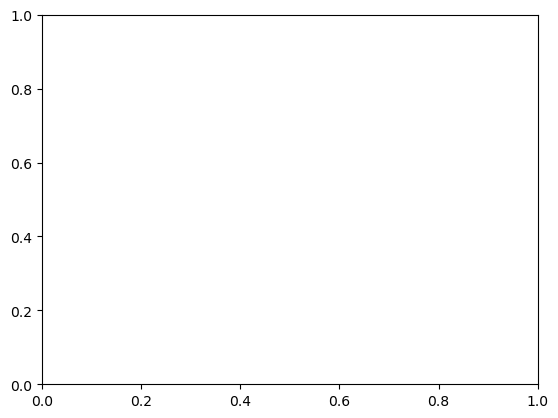

In [16]:
adata.obsm['X_umap'] = adata.obsm['go_embedding_umap']
sc.pl.umap(adata, color = 'GO:0000006')

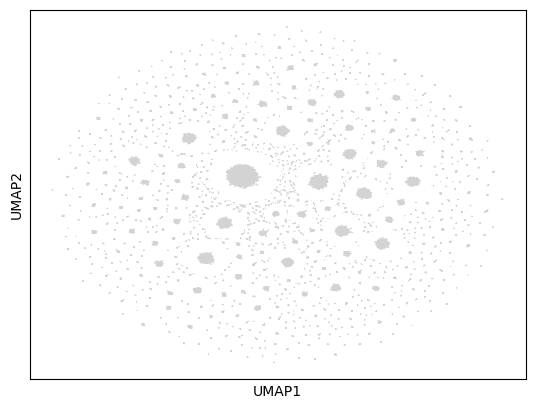

In [41]:
adata.obsm['X_umap'] = adata.obsm['go_latent_umap']
sc.pl.umap(adata)

In [35]:
sc.pl.umap(adata, obsm="go_latent_umap")

KeyError: "Could not find 'umap' or 'X_umap' in .obsm"

In [40]:
adata.write_h5ad('../data/adata.h5ad')

In [7]:
adata = sc.read_h5ad('../data/adata.h5ad')
adata

AnnData object with n_obs × n_vars = 108486 × 512
    obs: 'GO_ID', 'UniProt_ID'
    uns: 'X_umap', 'esm_embedding_umap', 'esm_latent_umap', 'go_embedding_umap', 'go_latent_umap', 'neighbors'
    obsm: 'X_umap', 'esm_embedding', 'esm_embedding_umap', 'esm_latent', 'esm_latent_umap', 'go_embedding', 'go_embedding_umap', 'go_latent', 'go_latent_umap'
    obsp: 'connectivities', 'distances'

In [8]:
question_latent

[tensor([-3.1210e-01, -5.2475e-01, -1.4942e-01, -1.6665e-01, -2.4190e-01,
         -1.6594e-01, -4.2490e-01,  4.1173e+00, -1.7018e-01, -6.1926e-01,
         -1.6665e-01, -2.9622e-01, -1.6736e-01, -1.8390e-01,  1.3728e+00,
         -1.7064e-01,  8.0632e-02, -1.7216e-01, -1.6667e-01, -1.6659e-01,
         -1.7043e-01, -3.8561e-01, -1.6438e-01, -1.6665e-01, -1.6937e-01,
         -1.6623e-01, -1.6124e-01, -1.6677e-01, -1.6685e-01, -2.9834e-01,
         -1.6666e-01, -1.6665e-01, -4.1689e-01,  1.6309e-01, -1.6665e-01,
          3.8066e-01,  6.1247e-01, -3.9157e-01,  8.4903e-01, -5.6745e-01,
         -2.0973e-01, -1.6653e-01, -1.7219e-01, -1.6647e-01, -1.4364e-01,
         -5.1037e-01, -4.0442e-01, -1.7082e-01, -1.6531e-01, -1.6637e-01,
         -1.4075e-01, -4.0798e-01,  3.9179e+00, -1.6656e-01, -1.6549e-01,
          5.3693e-01,  1.6976e+00, -1.6663e-01, -1.4377e-01, -1.7149e-01,
         -1.6659e-01, -1.7188e-01, -1.6627e-01,  3.8751e+00, -1.6661e-01,
         -5.7169e-01, -1.7139e-01,  1.

In [9]:
question_embeddings

[tensor([ 2.3932e-01, -2.8667e-01,  2.5292e-01, -3.5142e-01, -4.0507e-01,
         -3.1378e-01, -2.3108e-01,  2.0572e-01, -1.5629e-01, -6.2101e-03,
          4.1178e-01,  1.1131e-02,  3.0751e-02, -1.4289e-01, -4.5434e-01,
         -4.8890e-02, -3.6977e-01,  2.9895e-01, -3.7174e-01,  1.3845e-01,
          1.8527e-01, -1.4899e-01, -2.8884e-02, -1.5610e-01, -5.4121e-02,
          1.9507e-01,  2.5036e-01, -4.2191e-01, -2.1912e-02, -1.9074e-01,
         -9.9744e-02,  5.3045e-02, -1.0787e-01,  6.5915e-01, -2.2040e-01,
          1.1345e-01,  7.8754e-02, -4.2356e-01,  5.7712e-01, -2.9567e-01,
          1.8204e-01, -3.2404e-01, -3.3353e-01,  1.5945e-01, -2.5512e-01,
         -2.4306e-01, -4.6788e-02, -6.3832e-02,  7.3488e-02,  2.0821e-01,
         -7.6055e-02, -3.0963e-01, -3.0484e-01,  2.7407e-02,  5.9046e-01,
          2.6310e-01,  1.8498e-01, -2.1689e-01,  7.1780e-02, -9.8088e-02,
         -7.7902e-03,  6.0731e-02, -4.1532e-01,  2.8812e-01,  3.0108e-01,
          1.2374e-01, -1.5190e-01, -5.

In [14]:
adata.obsm['go_embedding']

array([[-0.01779631, -0.12225305,  0.25471777, ..., -0.41169578,
         0.1257713 ,  0.01909216],
       [-0.01779631, -0.12225305,  0.25471777, ..., -0.41169578,
         0.1257713 ,  0.01909216],
       [-0.04929248, -0.09673819,  0.26219782, ..., -0.38138968,
        -0.04886395,  0.03955503],
       ...,
       [-0.33868045, -0.09812789,  0.09253527, ..., -0.35428017,
         0.77219766,  0.07521744],
       [-0.12485313, -0.01735236, -0.00894738, ..., -0.13178827,
         0.37271804,  0.28951216],
       [-0.12485313, -0.01735236, -0.00894738, ..., -0.13178827,
         0.37271804,  0.28951216]], shape=(108486, 768), dtype=float32)

In [12]:
adata.obs

,GO_ID,UniProt_ID
0,GO:0002020,P01023
1,GO:0002020,P01023
2,GO:0004866,P01023
3,GO:0004866,P01023
4,GO:0004866,P01023
...,...,...
108481,GO:0004725,Q6B8I1
108482,GO:0008138,Q6B8I1
108483,GO:0016787,Q6B8I1
108484,GO:0016791,Q6B8I1


In [16]:
question_tensor = torch.stack(question_embeddings)  # shape [N_q, 768]

# Convert AnnData GO embeddings to tensor
go_tensor = torch.tensor(adata.obsm["go_embedding"], dtype=torch.float32)  # shape [N_go, 768]

# Normalize both
question_tensor = F.normalize(question_tensor, dim=1)
go_tensor = F.normalize(go_tensor, dim=1)


In [17]:
# Cosine similarity matrix: [N_q, N_go]
similarity = torch.matmul(question_tensor, go_tensor.T)

# Get top-k most similar GO terms for each question
topk = 5
topk_scores, topk_indices = torch.topk(similarity, k=topk, dim=1)


In [30]:
go_ids = adata.obs["GO_ID"].tolist()

for i, (scores, indices) in enumerate(zip(topk_scores, topk_indices)):
    print(f"\nQuestion {i+1}:")
    for j in range(topk):
        go_index = indices[j].item()
        print(f"  Rank {j+1}: {go_ids[go_index]} (score={scores[j].item():.4f})   {str(go_df[go_df['go_id'] == go_ids[go_index]]['name'].iloc[0])}")


Question 1:
  Rank 1: GO:0008513 (score=0.9125)   secondary active organic cation transmembrane transporter activity
  Rank 2: GO:0001409 (score=0.9107)   guanine nucleotide transmembrane transporter activity
  Rank 3: GO:0001409 (score=0.9107)   guanine nucleotide transmembrane transporter activity
  Rank 4: GO:0035727 (score=0.9070)   lysophosphatidic acid binding
  Rank 5: GO:0035727 (score=0.9070)   lysophosphatidic acid binding

Question 2:
  Rank 1: GO:0035727 (score=0.9203)   lysophosphatidic acid binding
  Rank 2: GO:0035727 (score=0.9203)   lysophosphatidic acid binding
  Rank 3: GO:0035727 (score=0.9203)   lysophosphatidic acid binding
  Rank 4: GO:0035727 (score=0.9203)   lysophosphatidic acid binding
  Rank 5: GO:0035727 (score=0.9203)   lysophosphatidic acid binding

Question 3:
  Rank 1: GO:0008513 (score=0.9225)   secondary active organic cation transmembrane transporter activity
  Rank 2: GO:0001409 (score=0.9197)   guanine nucleotide transmembrane transporter activity